<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [3]:
import json

In [4]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
from tqdm import tqdm
import h5py

In [6]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
!{sys.executable} -m pip install h5py tqdm

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://github.com/nadiinchi/dl_labs/blob/master/ht_attention_preprocess_data.ipynb).

Please either download data from [here](https://yadi.sk/d/KGh1SngBWH4stg) or generate it manually using the above script.

In [7]:
f = h5py.File('/content/gdrive/MyDrive/1/img_codes.hdf5', 'r')
img_codes = f['data']

In [212]:
captions = json.load(open('/content/gdrive/MyDrive/1/captions_tokenized.json'))

In [213]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [214]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts. 

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [126]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
for i in captions:
    for j in i:
        for w in j:
            word_counts[w]+=1

In [127]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [128]:
index_to_word = {v: k for k, v in word_to_index.items()}

In [129]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [130]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part. 

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [131]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [132]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        result = torch.matmul(queries,torch.transpose(keys, 1,2))/ np.sqrt(keys.shape[2])
        return result

Test for ScaledDotProductScore

In [133]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [134]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        scores = self.scorer(queries, keys)
        maximal = torch.tensor(86)
        if torch.cuda.is_available():
            scores = scores.cuda()
            maximal = maximal.cuda()
            values = values.cuda()
        scores = torch.min(scores, maximal)
        # scores = scores.min(torch.tensor(87).cuda())
        weights = torch.exp(scores) / torch.unsqueeze(torch.sum(torch.exp(scores),dim = 2), -1)
        # weights = torch.min(weights, torch.tensor(1e1))
        self.attention_map = weights.detach()
        result = torch.matmul(weights,values)
        return result

Tests for Attention layer

In [135]:
attn = Attention(ScaledDotProductScore())

In [136]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [137]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [138]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]], device='cuda:0')
Responses:
 tensor([[[1.0000],
         [1.2552]]], device='cuda:0')


### Language model

In [139]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()

        # a layer that converts conv features to 
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)

        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(n_tokens, emb_size)

        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())

        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)

        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(emb_size + cnn_channels, lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = torch.nn.Sequential(nn.Linear(emb_size + lstm_units + cnn_channels, emb_size + lstm_units + cnn_channels),
                                    nn.ReLU(),
                                    nn.Linear(emb_size + lstm_units + cnn_channels, n_tokens))

    def forward(self, image_features, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))
        
        image_features = image_features.transpose(1, 2)
        
        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix)
        attn_keys = self.cnn_to_attn_key(image_features)

        hx = initial_hid
        cx = initial_cell
        for i in range(captions_emb.shape[1]):
            response = self.attention(hx.unsqueeze(1), attn_keys, image_features)
            concat1 = torch.cat((response, captions_emb[:, i].unsqueeze(1)), 2)
            hx, cx = self.lstm(concat1.squeeze(1), (hx, cx))
            if i == 0:
                attention_maps = self.attention.attention_map
                recurrent_out = torch.cat((hx.unsqueeze(1), concat1),2)
            else:
                attention_maps = torch.cat((attention_maps, self.attention.attention_map),1)
                recurrent_out = torch.cat((recurrent_out, torch.cat((hx.unsqueeze(1), concat1),2)),1)

        logits = self.logits_mlp(recurrent_out)
        
        # return logits and attention maps from (2.4)
        return logits, attention_maps

In [140]:
network = CaptionNet(n_tokens)
if torch.cuda.is_available():
    network = network.cuda()

In [141]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

if torch.cuda.is_available():
    dummy_capt_ix = dummy_capt_ix.cuda()
    dummy_img_vec = dummy_img_vec.cuda()

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [142]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus 
              attention regularizer. Scalar float tensor
    """
    
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()
    
    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)
    
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    loss = nn.CrossEntropyLoss(ignore_index=pad_ix)
    if torch.cuda.is_available():
        loss = loss.cuda()
    loss = loss(logits_for_next.transpose(1,2), captions_ix_next)

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()
    
    return loss + regularizer

In [143]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [144]:
optim = torch.optim.Adam(network.parameters(), lr=1e-4)

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [145]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx
    
    def __len__(self):
        return len(self.idx)
        
    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [146]:
captions = np.array(captions)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

In [147]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0
    
    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)
    
    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [148]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0764, 0.3785, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9595, 1.1179, 0.9478],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)
 

* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again
 
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [208]:
batch_size = 64  # adjust me
n_epochs = 80    # adjust me
n_batches_per_epoch = 64  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [189]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()
   
    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
            train_loss += float(loss_t)
            # clear old gradients; do a backward pass to get new gradients; then train with opt
            optim.zero_grad()
            loss_t.backward()
            optim.step()
        
    train_loss /= n_batches_per_epoch
        
    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches
    
    # if torch.cuda.is_available():
    #     network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|██████████| 64/64 [00:22<00:00,  2.86it/s]



Epoch: 0, train loss: 3.749897036701441, val loss: 3.7915661931037903


100%|██████████| 64/64 [00:22<00:00,  2.79it/s]



Epoch: 1, train loss: 3.7048102654516697, val loss: 3.5749435424804688


100%|██████████| 64/64 [00:22<00:00,  2.88it/s]



Epoch: 2, train loss: 3.7269530817866325, val loss: 3.7296265959739685


100%|██████████| 64/64 [00:22<00:00,  2.83it/s]



Epoch: 3, train loss: 3.7261017337441444, val loss: 3.7016117870807648


100%|██████████| 64/64 [00:22<00:00,  2.85it/s]



Epoch: 4, train loss: 3.6873738281428814, val loss: 3.7040612399578094


100%|██████████| 64/64 [00:21<00:00,  2.93it/s]



Epoch: 5, train loss: 3.698552493005991, val loss: 3.7699567079544067


100%|██████████| 64/64 [00:16<00:00,  3.95it/s]



Epoch: 6, train loss: 3.6628362387418747, val loss: 3.5910431146621704


100%|██████████| 64/64 [00:17<00:00,  3.68it/s]



Epoch: 7, train loss: 3.6605083607137203, val loss: 3.719171017408371


100%|██████████| 64/64 [00:20<00:00,  3.18it/s]



Epoch: 8, train loss: 3.653910357505083, val loss: 3.7372608482837677


100%|██████████| 64/64 [00:21<00:00,  2.96it/s]



Epoch: 9, train loss: 3.676470708101988, val loss: 3.7663698494434357


100%|██████████| 64/64 [00:22<00:00,  2.84it/s]



Epoch: 10, train loss: 3.6762578040361404, val loss: 3.6717778742313385


100%|██████████| 64/64 [00:22<00:00,  2.81it/s]



Epoch: 11, train loss: 3.6617892794311047, val loss: 3.723983556032181


100%|██████████| 64/64 [00:21<00:00,  2.93it/s]



Epoch: 12, train loss: 3.6451118290424347, val loss: 3.6739220917224884


100%|██████████| 64/64 [00:22<00:00,  2.86it/s]



Epoch: 13, train loss: 3.6857302971184254, val loss: 3.5227255821228027


100%|██████████| 64/64 [00:22<00:00,  2.85it/s]



Epoch: 14, train loss: 3.646038006991148, val loss: 3.731254428625107


100%|██████████| 64/64 [00:22<00:00,  2.90it/s]



Epoch: 15, train loss: 3.619358830153942, val loss: 3.713829606771469


100%|██████████| 64/64 [00:22<00:00,  2.88it/s]



Epoch: 16, train loss: 3.6356239058077335, val loss: 3.6411741971969604


100%|██████████| 64/64 [00:22<00:00,  2.90it/s]



Epoch: 17, train loss: 3.6157349348068237, val loss: 3.6553328931331635


100%|██████████| 64/64 [00:22<00:00,  2.81it/s]



Epoch: 18, train loss: 3.6192880794405937, val loss: 3.5920762419700623


100%|██████████| 64/64 [00:22<00:00,  2.84it/s]



Epoch: 19, train loss: 3.6261368058621883, val loss: 3.6392202973365784


100%|██████████| 64/64 [00:22<00:00,  2.88it/s]



Epoch: 20, train loss: 3.6198197193443775, val loss: 3.59229975938797


100%|██████████| 64/64 [00:21<00:00,  2.93it/s]



Epoch: 21, train loss: 3.607696134597063, val loss: 3.5400200188159943


100%|██████████| 64/64 [00:21<00:00,  2.93it/s]



Epoch: 22, train loss: 3.57664792239666, val loss: 3.706940621137619


100%|██████████| 64/64 [00:22<00:00,  2.85it/s]



Epoch: 23, train loss: 3.5884049125015736, val loss: 3.6869833767414093


100%|██████████| 64/64 [00:21<00:00,  2.92it/s]



Epoch: 24, train loss: 3.593187127262354, val loss: 3.5680760741233826


100%|██████████| 64/64 [00:22<00:00,  2.91it/s]



Epoch: 25, train loss: 3.598391316831112, val loss: 3.6635189950466156


100%|██████████| 64/64 [00:22<00:00,  2.85it/s]



Epoch: 26, train loss: 3.5623678863048553, val loss: 3.569936901330948


100%|██████████| 64/64 [00:22<00:00,  2.87it/s]



Epoch: 27, train loss: 3.5435045287013054, val loss: 3.5972401797771454


100%|██████████| 64/64 [00:22<00:00,  2.89it/s]



Epoch: 28, train loss: 3.5420356318354607, val loss: 3.5162360966205597


100%|██████████| 64/64 [00:22<00:00,  2.87it/s]



Epoch: 29, train loss: 3.541995294392109, val loss: 3.4911444187164307
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [190]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """
    
    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits
    
features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [191]:
def generate_caption(image, caption_prefix = ("#START#",), 
                     t=1, sample=True, max_len=100):
    
    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)
    
    attention_maps = []
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())
        
        assert len(next_word_probs.shape) ==1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [192]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))
        
def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

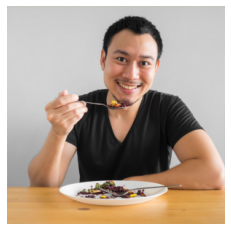

In [193]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man in a suit and a tie with a knife .
a man in a white shirt and a man in a white shirt .
a man in a white shirt is holding a pizza .
a man in a white shirt and a woman is sitting on a table .
a man in a suit and a picture of a pizza .
a man in a suit and a picture of a pizza .
a man with a white shirt and a person on a table .
a man in a suit and a picture of a pizza .
a man in a suit and a picture of a pizza .
a man with a knife and a picture of a pizza .


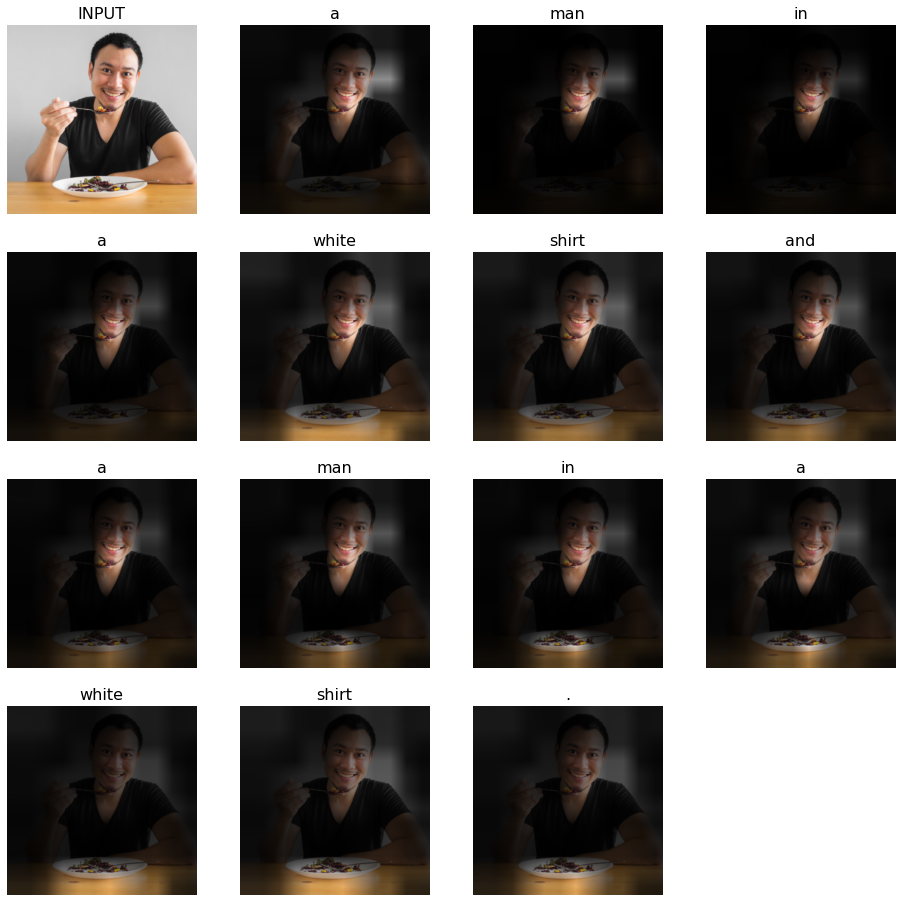

In [194]:
process_image(img)

a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a bike in the middle of a forest .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a bike .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .


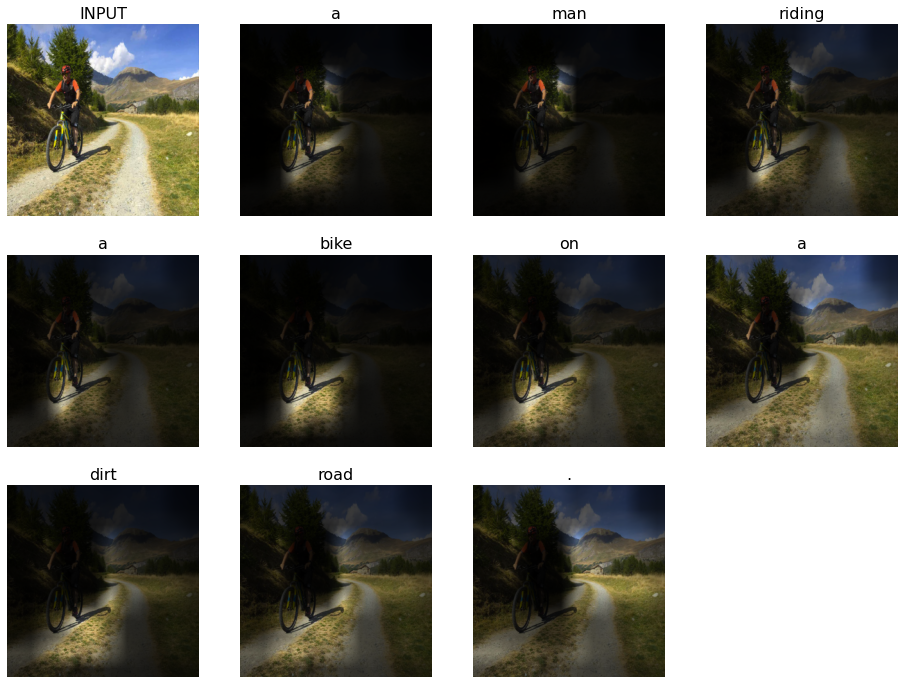

In [195]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

a black and white cat laying on a couch .
a black and white cat laying on a bed .
a cat is laying on a couch on a couch .
a black and white cat laying on a bed .
a black and white cat laying on a couch .
a black and white cat laying on a couch .
a cat laying on a couch in a chair .
a black and white cat laying on a bed .
a black and white cat laying on a bed .
a cat laying on a couch next to a cat .


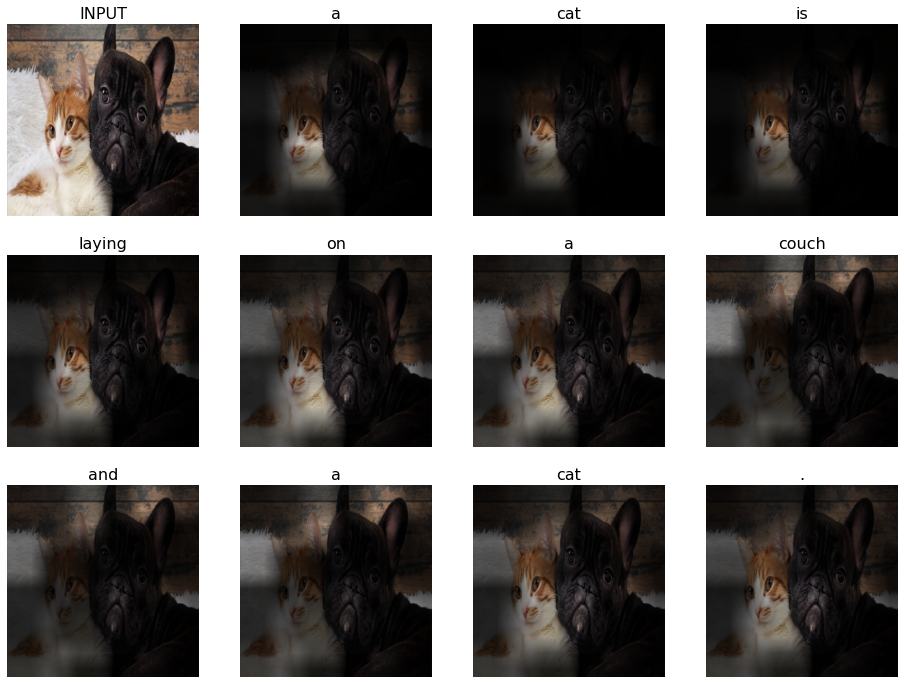

In [196]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man riding a skateboard in a skate park .
a man riding a skateboard on a skateboard .
a man riding a skateboard on a skateboard .
a man riding a skateboard trick on a skateboard .
a man riding a skateboard trick on a skateboard .
a man riding a skateboard trick on a skateboard .
a man riding a skateboard trick on a skateboard .
a man riding a skateboard on a skateboard .
a man riding a skateboard trick on a skateboard .
a man riding a skateboard trick on a skateboard .


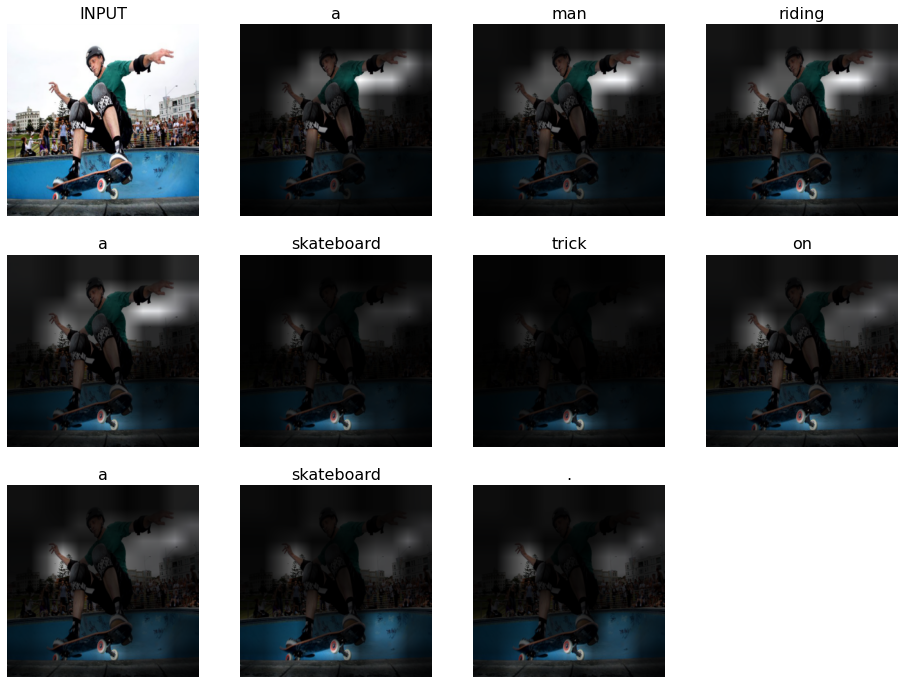

In [197]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

a woman standing in a field with a large tree .
a woman is standing in a field with a large tree .
a woman is standing in a field with a large tree .
a woman is standing on a wooden bench .
a woman standing in a field with a large bird .
a woman with a large green and white umbrella .
a woman standing in a field with a large tree .
a giraffe standing in a field with a large green and white .
a woman walking in a large green field .
a woman standing in a field with a large bird .


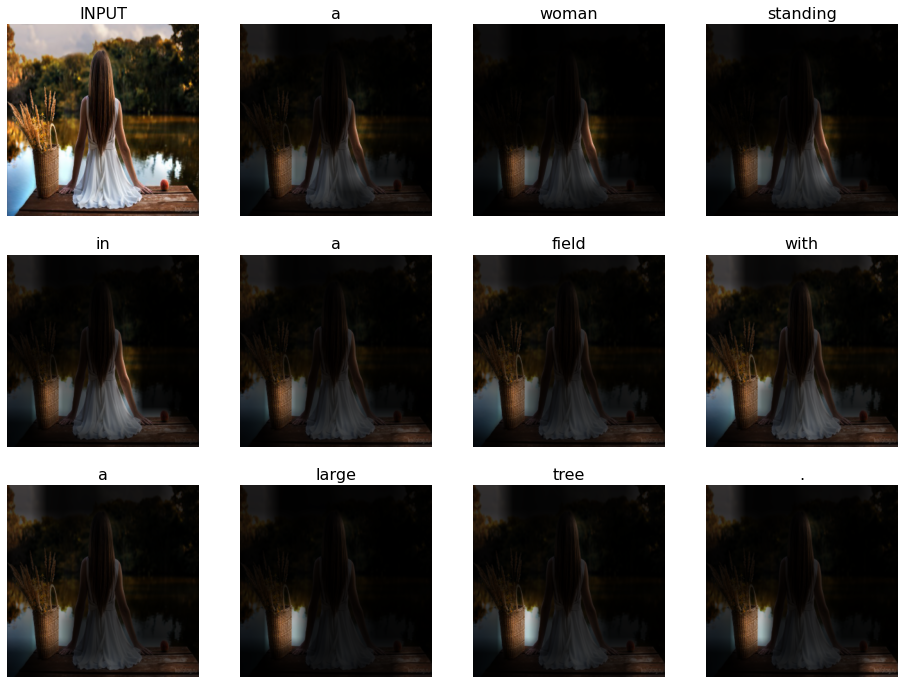

In [198]:
process_image(obtain_image(url="https://xaxa-net.ru/uploads/posts/2019-07/1562076597_krasivye-foto-leta_xaxa-net.ru-1.jpg"))

a brown bear is standing in a tree .
a cat is sitting on a rock in a tree .
a brown bear is sitting on a rock in a field .
a brown bear is standing in a field .
a brown bear is sitting on a rock in the water .
a brown bear is standing on a rock .
a brown bear is sitting on a rock in a field .
a brown bear is standing in a large body of water .
a cat is standing in a large body of water .
a cat is standing in a large body of water .


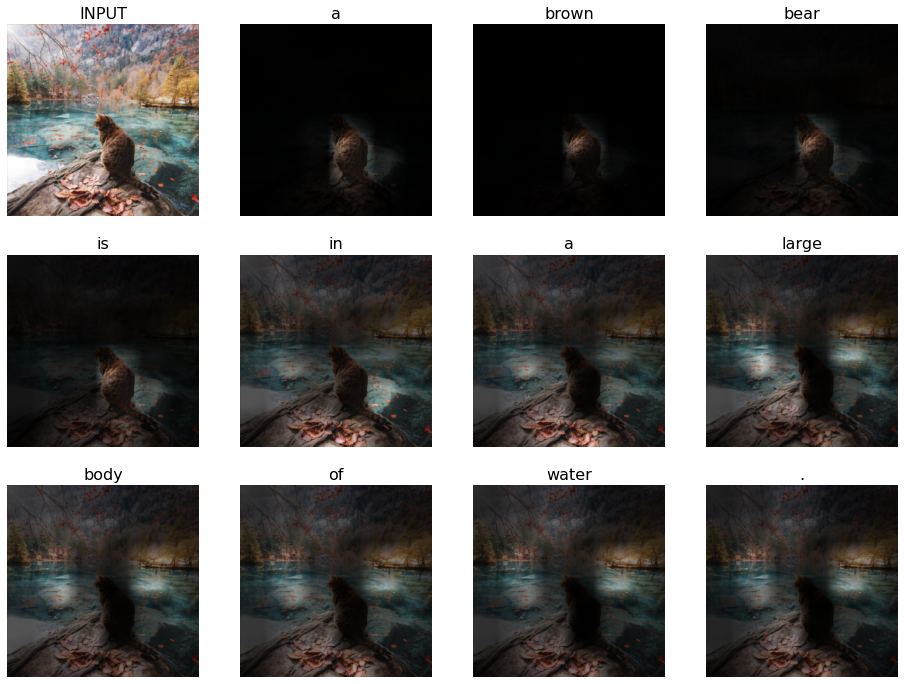

In [199]:
process_image(obtain_image(url="https://cs10.pikabu.ru/post_img/big/2019/07/22/0/1563743965120255559.jpg"))

a large clock tower with a large clock on it .
a large white photo of a large clock tower with a large clock on it .
a large clock tower with a large clock on it .
a large clock tower with a large clock on it .
a large white photo of a large building with a large clock on it .
a large clock tower with a large clock on it .
a large clock tower with a large clock on it .
a large clock tower with a large clock on it .
a large white photo of a large clock tower with a large clock .
a large clock tower with a clock on it .


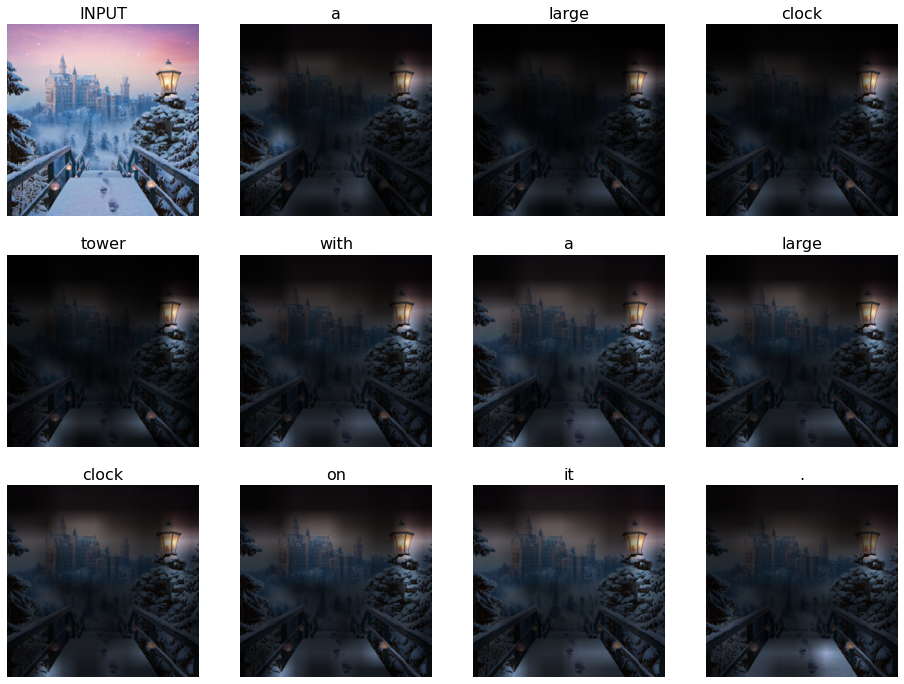

In [200]:
process_image(obtain_image(url="https://funik.ru/wp-content/uploads/2019/01/b3ff250b29f7db82133a-700x782.jpg"))

a train is parked in a field with a tree .
a train is parked in a field with a tree .
a train is sitting on a bench next to a tree .
a train is sitting on a bench near a tree .
a black and white photo of a train traveling down a road .
a train is parked in a field with a tree .
a train is sitting on a bench in a field .
a train traveling down a street next to a tree .
a bench with a red and white flowers in a park .
a train traveling down a street next to a tree .


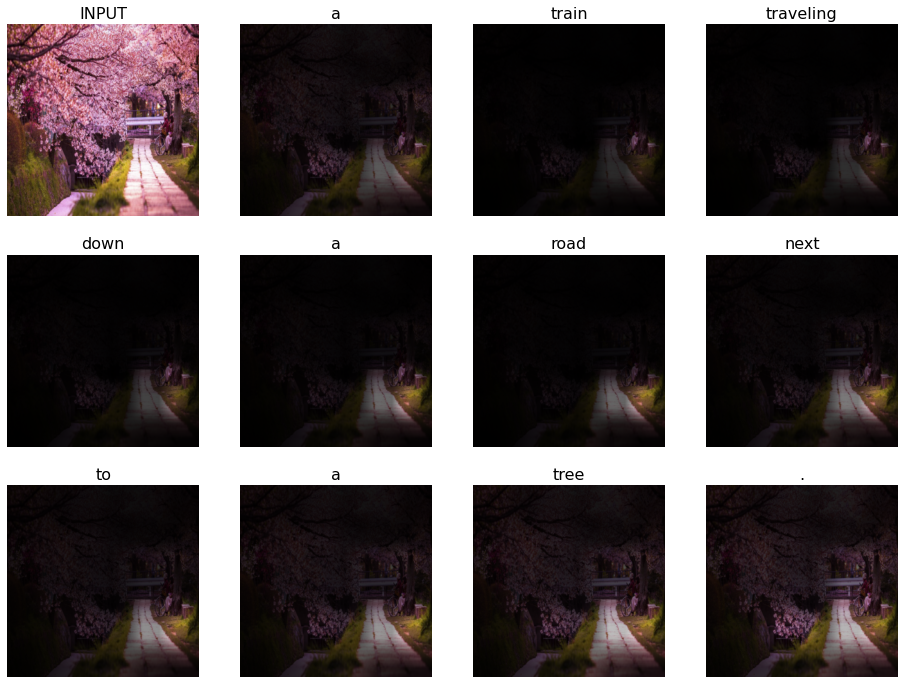

In [201]:
process_image(obtain_image(url="https://img.tsn.ua/cached/1575537022/tsn-87394d020f46df1bdfb04b5785c6f4e0/thumbs/1200x630/7a/0b/5ada0de0a76e02042a4424ea78c60b7a.jpeg"))

a couple of people walking down a street .
a large group of people walking down a street .
a man is standing on a bench with a tree .
a large group of people walking down a street .
a man is standing in a park bench .
a man is walking down a street with a large building .
a man is sitting on a bench near a fence .
a man in a park bench on a bench .
a bench with a large clock on the side of a street .
a man is standing in a park bench .


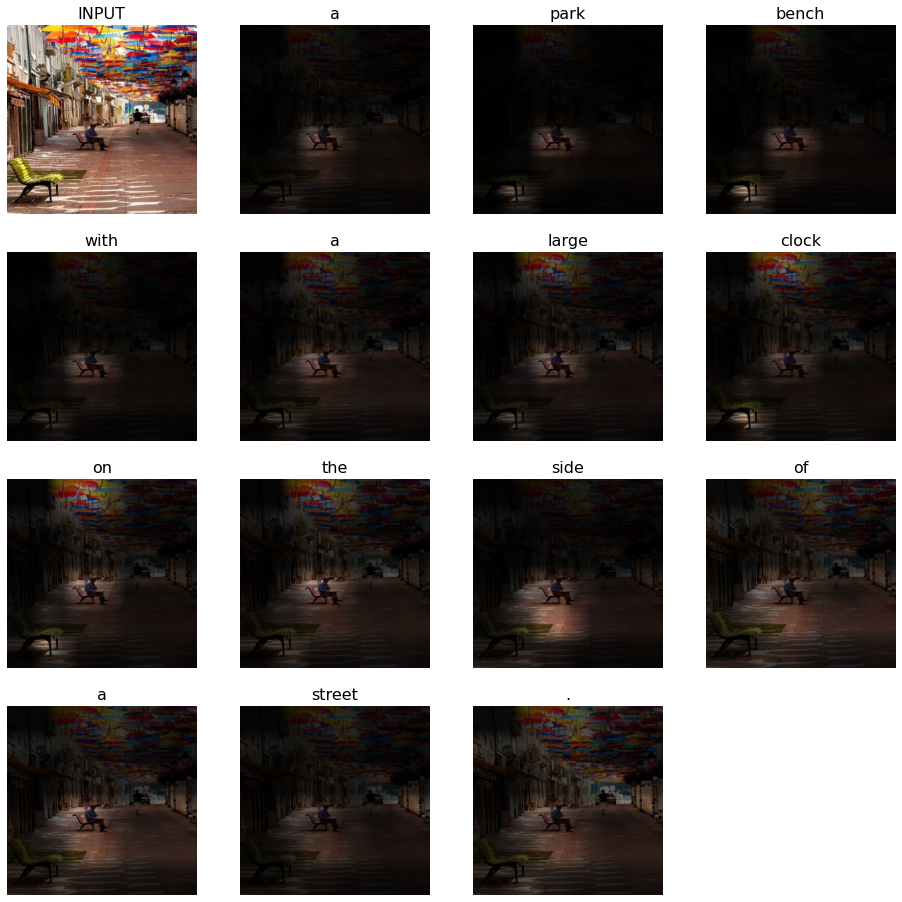

In [202]:
process_image(obtain_image(url="https://i.pinimg.com/474x/c4/73/05/c4730576b6bd88e39364bef9362a8ad2.jpg"))

a man riding a surf board in the water .
a person riding a surf board on a beach .
a man riding a horse on a beach .
a man riding a horse on a beach .
a person riding a horse on a beach .
a person riding a horse on a beach .
a man riding a surf board in the water .
a man riding a surf board in the water .
a man riding a horse on a beach .
a person riding a horse on a beach .


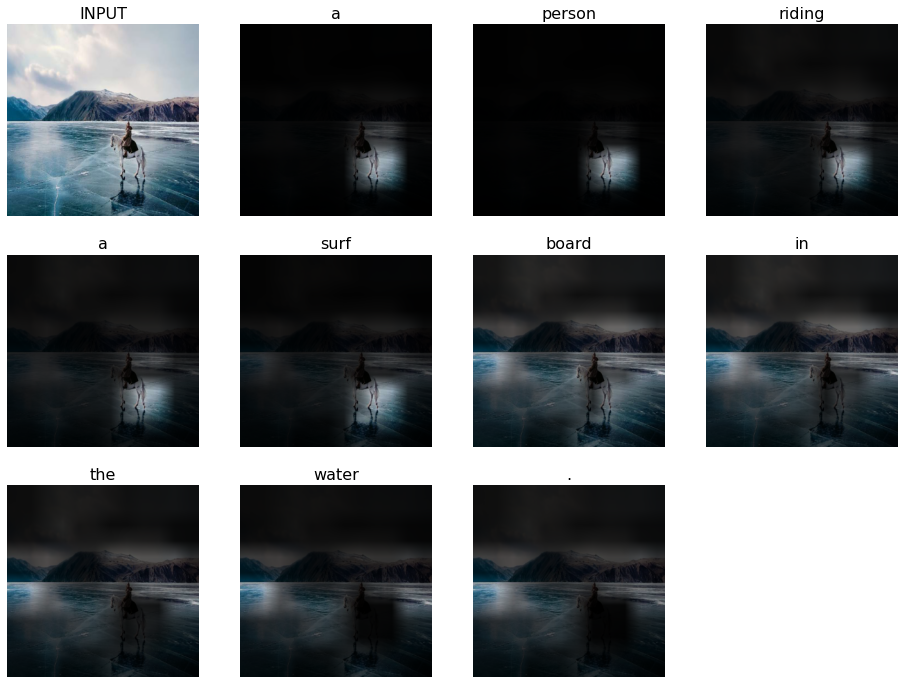

In [203]:
process_image(obtain_image(url="https://concept.kg/media/cache/23/bd/23bd5275613cdeb873debeca1bbdcc73.jpg"))

a little boy wearing a hat and a child .
a little boy is holding a frisbee in a park .
a little boy is sitting on a bench with a remote .
a little boy is sitting on a bed with a frisbee .
a little boy is sitting on a bench .
a little boy is sitting on a bench .
a little boy is sitting on a bench on a bench .
a little boy in a black shirt and a woman in a room .
a little boy is holding a frisbee in a park .
a little boy is sitting on a bench .


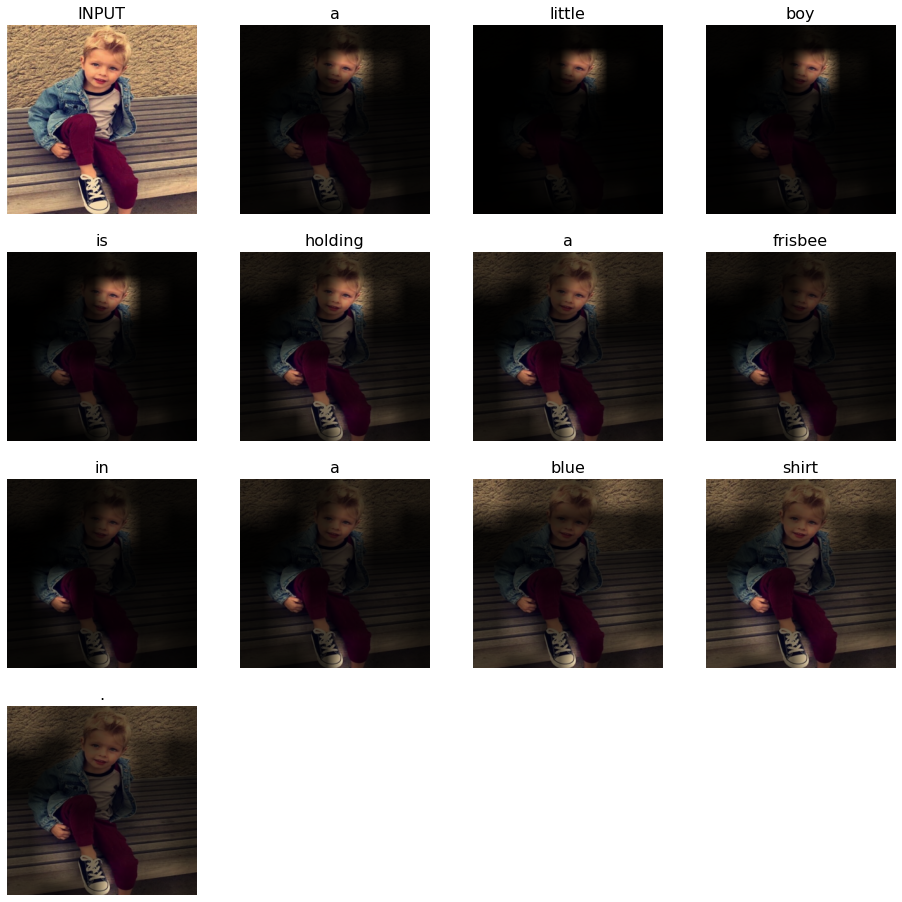

In [204]:
process_image(obtain_image(url="https://new-magazine.ru/wp-content/uploads/2020/07/zkzMx41HnkY.jpg"))

a large cow standing in a field with a cow .
a cow standing on a field with a cow .
a man standing on a horse in a field .
a cow standing in a field with a brown cow .
a man standing in a field with a cow .
a man riding a horse in a field .
a herd of cows standing in a field .
a man riding a horse in a field .
a cow standing in a field of a field .
a black and white cow standing in a field .


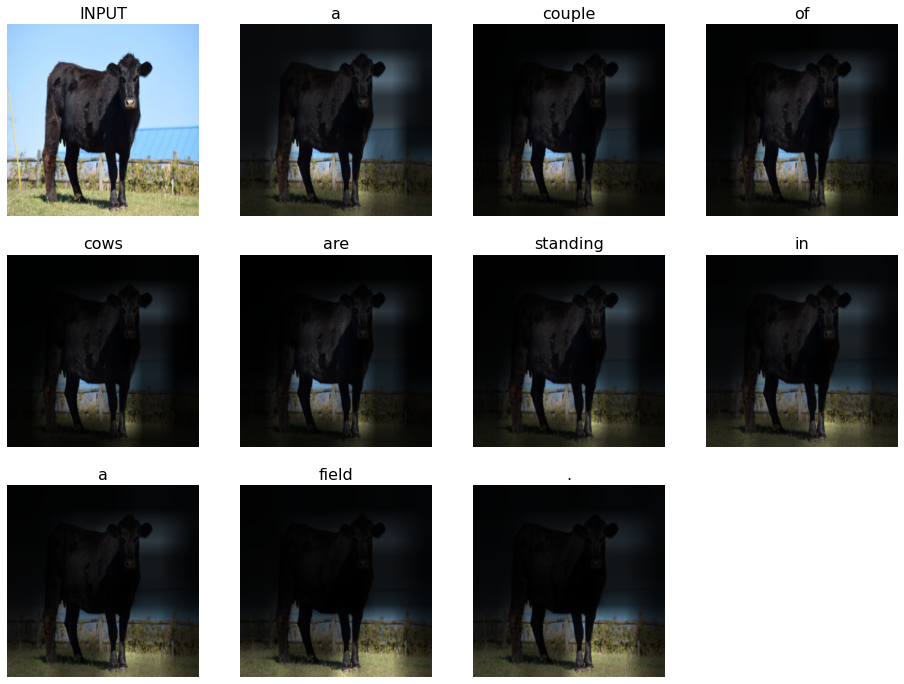

In [205]:
process_image(obtain_image(url="https://cepia.ru/images/u/pages/4687/korova.jpg"))

a woman riding a bike on a bike .
a woman riding a bike on a bike .
a woman riding a bike on a bike in front of a lake .
a woman riding a bike on a bike .
a woman riding a bike on a bike .
a woman riding a bike on a bike .
a woman riding a bike on a beach .
a woman riding a bike on a road .
a woman riding a bike on a bike .
a woman riding a bike on a bike .


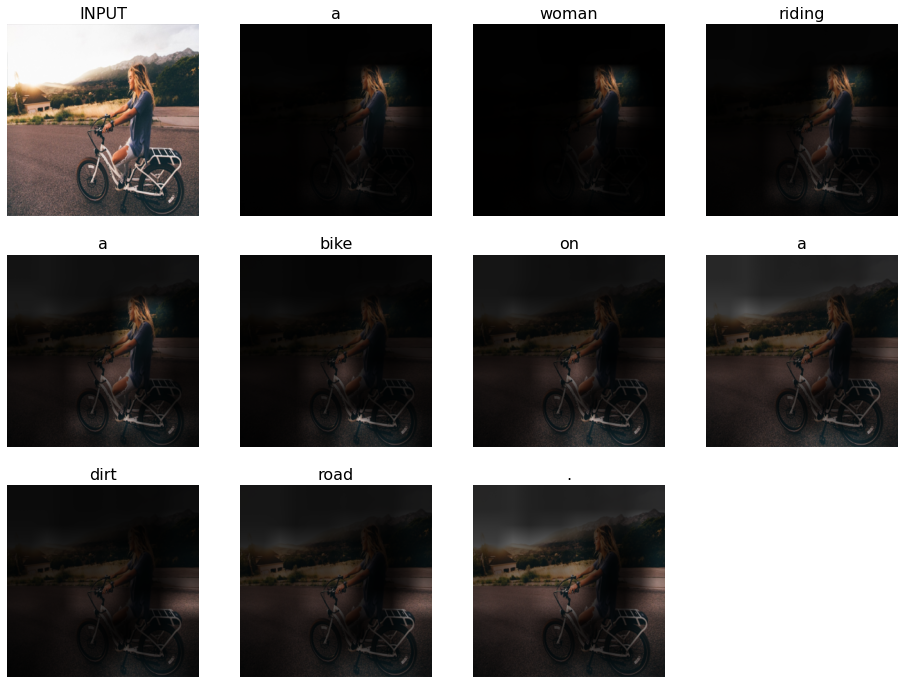

In [206]:
process_image(obtain_image(url="https://sochi.scapp.ru/wp-content/uploads/post/2016/07/5-5.jpg"))

a bike is on a bike with a bike .
a bike is sitting on a bike in front of a building .
a bike with a bicycle on a bike in the background .
a man riding a bike on a bike .
a bike is parked in a large building .
a person riding a bike in a city
a bike is parked in a parking lot .
a bike is sitting on a wooden table .
a bike is sitting on a wooden bench .
a bike is on a wooden bench .


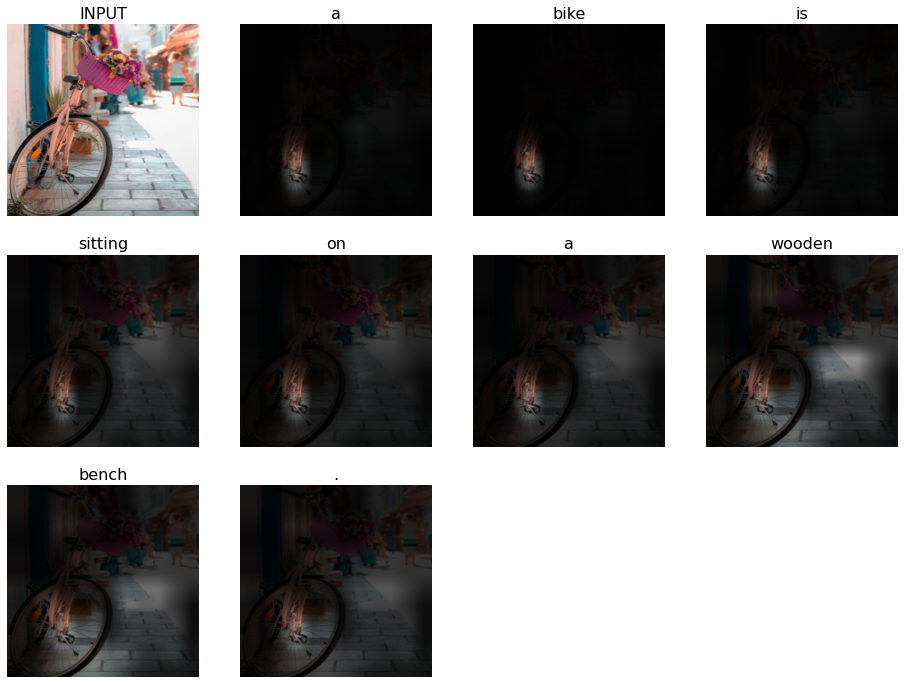

In [207]:
process_image(obtain_image(url="https://99px.ru/sstorage/56/2018/05/mid_300392_537643.jpg"))

### Conclusion
The model was developed according to the issued template. The material has been mastered with an understanding of what is happening, what is going where and how it is connected.

Learning rate is set to 1e-4. When training for 200 epochs, the model produces a loss of about 3.3. But in practice, it is very wrong in the description of the pictures. Apparently retraining is taking place. The ideal value was chosen for the number of epochs equal to 80, so that the error was equal to 3.7.

Perhaps you need to add an additional hidden layer along with the dropout to the layer of neurons in the logits count, since with two hidden layers without dropuot and 210 epochs, the model was also heavily retrained.

///////////////////////////////////////////////////////////////////

Была разработана модель по выданному шаблону. Освоен материал с пониманием происходящего, что куда отправляется и как подключено. 

Learning rate выставлен в значении 1е-4. При обучении на 200 эпохах модель выдает loss, равный около 3.3. Но на практике сильно ошибается в описании картинок. Видимо происходит переобучение. Идеальным значением было подобрано количество эпох, равное 80, чтобы ошибка была равна 3.7.

Возможно нужно добавить в слое нейронов в подсчете logits дополнительный скрытый слой вместе с dropout, так как при двух скрытых слоях без dropuot и количестве эпох 210 модель также сильно переобучалась.

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt). 
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563